# 4. 데이터 탐색 이해와 실무
### 4.1 일변량 비시각화

### 사전 데이터 탐색
#### 테이블 정의서(예시)

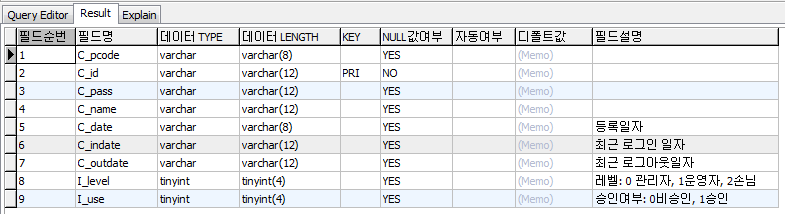

In [4]:
from IPython.display import Image
 
Image("C:/Users/qctum/table.png")

 + 테이블 내 존재하는 데이터들의 기본 정보 확인을 위한 관리 체계
 + 변수(컬럼)별 컬럼명, 속성명, 타입, 길이, NULL 허용여부 등 정보 확인

In [4]:
import numpy as np
import pandas as pd

In [5]:
# 실습활용을 위해 sklearn 패키지 내 보스턴 주택가격 데이터 로딩

import warnings
from sklearn.datasets import load_boston
with warnings.catch_warnings():
    warnings.filterwarnings("ignore")
    data = load_boston()

In [6]:
# 데이터프레임 생성 및 Merge
X = pd.DataFrame(data.data, columns = data.feature_names)
y = pd.DataFrame(data.target, columns = ['MEDV'])

housing = pd.merge(X, y, left_index=True, right_index=True, how='inner')
housing

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0


### 데이터 컬럼 설명
#### 보스턴 인근 Town 별 주택 가격 및 관련 정보 데이터셋

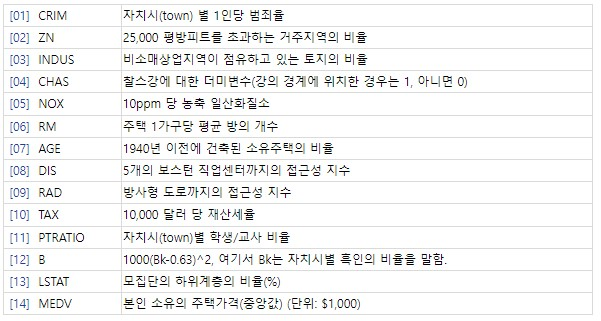

In [10]:
Image("C:/Users/qctum/boston_columns.jpg")

#### 데이터 개요 및 결측치, 구성 확인

In [7]:
# 데이터 copy
housing_data = housing.copy()

# 개요 및 결측치 확인
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


 * 모든 데이터 컬럼의 타입은 모두 float64
 * 사전 데이터 Description 내 CHAS는 카테고리 변수라 정의 >> 분석 단계시 변경 필요

In [8]:
# 데이터 head 확인
housing_data.head(10)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2
5,0.02985,0.0,2.18,0.0,0.458,6.430,58.7,6.0622,3.0,222.0,18.7,394.12,5.21,28.7
6,0.08829,12.5,7.87,0.0,0.524,6.012,66.6,5.5605,5.0,311.0,15.2,395.60,12.43,22.9
7,0.14455,12.5,7.87,0.0,0.524,6.172,96.1,5.9505,5.0,311.0,15.2,396.90,19.15,27.1
8,0.21124,12.5,7.87,0.0,0.524,5.631,100.0,6.0821,5.0,311.0,15.2,386.63,29.93,16.5
9,0.17004,12.5,7.87,0.0,0.524,6.004,85.9,6.5921,5.0,311.0,15.2,386.71,17.10,18.9


In [19]:
# 데이터 tail 확인
housing_data.tail(10)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
496,0.28960,0.0,9.69,0.0,0.585,5.390,72.9,2.7986,6.0,391.0,19.2,396.90,21.14,19.7
497,0.26838,0.0,9.69,0.0,0.585,5.794,70.6,2.8927,6.0,391.0,19.2,396.90,14.10,18.3
498,0.23912,0.0,9.69,0.0,0.585,6.019,65.3,2.4091,6.0,391.0,19.2,396.90,12.92,21.2
499,0.17783,0.0,9.69,0.0,0.585,5.569,73.5,2.3999,6.0,391.0,19.2,395.77,15.10,17.5
500,0.22438,0.0,9.69,0.0,0.585,6.027,79.7,2.4982,6.0,391.0,19.2,396.90,14.33,16.8
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48,22.0
505,0.04741,0.0,11.93,0.0,0.573,6.030,80.8,2.5050,1.0,273.0,21.0,396.90,7.88,11.9


 * head 및 tail 확인시, 데이터 형상이 유사하게 나타남

In [9]:
# 일부 데이터 범위 확인
print('CRIM_min: ', min(housing_data.CRIM))
print('AGE_min', min(housing_data.AGE))
print('MEDV_min', min(housing_data.MEDV))

CRIM_min:  0.00632
AGE_min 2.9
MEDV_min 5.0


 * 데이터 설명 기반의 관측 범위 확인<br><br>

### 범주형 일변량 비시각화

In [10]:
# 데이터 설명에 따라 CHAS 컴럼을 범주형 데이터로 변환
housing_data = housing_data.astype({'CHAS':'object'})
housing_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    object 
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(13), object(1)
memory usage: 55.5+ KB


In [11]:
# 범주형 데이터 빈도표
pd.crosstab(housing_data.CHAS, columns='count')

col_0,count
CHAS,
0.0,471
1.0,35


In [12]:
# 비율 환산
pd.crosstab(housing_data.CHAS, columns='count', normalize=True)

col_0,count
CHAS,
0.0,0.93083
1.0,0.06917


In [13]:
# 합 추가하기
pd.crosstab(housing_data.CHAS, columns='count', margins=True)

col_0,count,All
CHAS,,
0.0,471,471
1.0,35,35
All,506,506


In [14]:
# 합 추가하기
pd.crosstab(housing_data.CHAS, columns='count', margins=True, normalize=True)

col_0,count,All
CHAS,,
0.0,0.93083,0.93083
1.0,0.06917,0.06917
All,1.00000,1.00000


 * 단순 일변량의 구성을 확인하기에 간단한 함수로 활용 가능<br><br>
 
### 연속형 일변량 비시각화

In [15]:
housing_data = housing.copy()

In [16]:
# 데이터 설명에 따라 CHAS 컬럼을 범주형 데이터로 변환
housing_data = housing_data.astype({'CHAS':'object'})
# 기술통계량 및 4분위수 도출
housing_data.describe()

,CRIM,ZN,INDUS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
count,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000,506.000000
mean,3.613524,11.363636,11.136779,0.554695,6.284634,68.574901,3.795043,9.549407,408.237154,18.455534,356.674032,12.653063,22.532806
std,8.601545,23.322453,6.860353,0.115878,0.702617,28.148861,2.105710,8.707259,168.537116,2.164946,91.294864,7.141062,9.197104
min,0.006320,0.000000,0.460000,0.385000,3.561000,2.900000,1.129600,1.000000,187.000000,12.600000,0.320000,1.730000,5.000000
25%,0.082045,0.000000,5.190000,0.449000,5.885500,45.025000,2.100175,4.000000,279.000000,17.400000,375.377500,6.950000,17.025000
50%,0.256510,0.000000,9.690000,0.538000,6.208500,77.500000,3.207450,5.000000,330.000000,19.050000,391.440000,11.360000,21.200000
75%,3.677083,12.500000,18.100000,0.624000,6.623500,94.075000,5.188425,24.000000,666.000000,20.200000,396.225000,16.955000,25.000000
max,88.976200,100.000000,27.740000,0.871000,8.780000,100.000000,12.126500,24.000000,711.000000,22.000000,396.900000,37.970000,50.000000


In [17]:
# 4분위수 기반의 IQR 연산
q1 = housing_data['CRIM'].quantile(0.25)
q3 = housing_data['CRIM'].quantile(0.75)
IQR=q3-q1
print('q1: ', q1)
print('q3: ', q3)
print('IQR: ', IQR)

q1:  0.08204499999999999
q3:  3.6770825
IQR:  3.5950375


### 왜도 첨도 확인
 * 왜도(Skewness): 분포의 비대칭성을 나타내는 척도로, 얼마나 비대칭인지를 확인
   * 왜도의 경우 값이 0보다 크면 왼쪽으로 치우치고, 오른쪽 꼬리가 긴 형태의 분포를 보임

 * 첨도(Kurtosis): 분포의 뽀족한 정도를 나타내는 척도로, 평균에 관측치가 얼마나 모여있는지를 확인
   * 첨도의 경우 값이 0보다 크면 뽀족한 모양을 지님

In [18]:
# 왜도 및 첨도 확인
print('Skewness:', round(housing_data['CRIM'].skew(), 4))
print('Kurtosis:', round(housing_data['CRIM'].kurt(), 4))

Skewness: 5.2231
Kurtosis: 37.1305


 * CRIM컬럼의 왜도 첨도 확인 결과, 왼쪽으로 치우쳐 있고, 정규분포보다 훨씬 뾰족한 모양의 분포를 지닌 변수임을 확인

In [37]:
print('Skewness:', round(housing_data['MEDV'].skew(), 4))
print('Kurtosis:', round(housing_data['MEDV'].kurt(), 4))

Skewness: 1.1081
Kurtosis: 1.4952


 * MEDV컬럼의 왜도 첨도 확인 결과, 왜도 첨도는 비교적 높지 않은 변수임을 확인

In [38]:
# 연속형 데이터의 비대칭을 처리하며 모델링 적용을 하기위한 방안
# 왜도 첨도의 정도가 심한 변수의 로그 변환
print('Skewness:', np.log(round(housing_data['CRIM'].skew(), 4)))
print('Kurtosis:', np.log(round(housing_data['CRIM'].kurt(), 4)))

Skewness: 1.6530910953555034
Kurtosis: 3.6144387342981585


 * 로그 변환 결과, 왜도 및 첨도의 정도가 크게 줄어들었음을 확인
 * 극단적 분포를 가진 원 데이터를 알고리즘에 적용하는 것보다, 로그 변환 등의 변환 후 적용하는 것이 정확한 분석 결과를 얻을 수 있음
<br><br>

### pandas-Profiling 패키지 소개

<br>

#### pandas-Profiling은 기본 EDA를 자동화하여 리포트를 생성하는 패키지

<br>

 * 데이터 head, tail 및 결측치
 * 범주형 및 연속형 변수의 주요 통계량 도출
 * 시각화까지 제공

In [2]:
import pandas_profiling
from pandas_profiling import ProfileReport
import warnings
warnings.filterwarnings('ignore')

 * Overview: 데이터 개요 확인
    * 컬럼 수, 데이터 관측치 수, 결측치 수, 중복 데이터 행, 컬럼 타입 별 개수 등의 정보 확인
 * Variable: 각 컬럼 별 타입 및 정보 확인
    * 고유값 개수(Unique한 데이터)
    * 연속형의 경우 평균, 최대, 최소 및 Quantile statistics 및 왜도 첨도 등 주요 통계량 확인
    * 범주형의 경우 범주 별 빈도 및 비율 확인
 * Interactions, Correlations: 두 개의 변수 간 상관관계 확인
 * Missing values: 결측치 확인
 * Sample: 데이터의 haed 및 tail 확인

In [19]:
housing_data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [21]:
# 프로파일링 결과 html을 파일로 저장
housing_data.profile_report().to_file('./housing_data_pr_report.html')

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#### pandas profiling의 특징 요약
 * 간단한 코드 구현으로, 데이터의 대부분 정보 확인 가능
 * 의사결정을 위한 리포트를 자동으로 생성하여 업무 활용 가능
 * 다만, 큰 데이터를 대상으로 실행 시 데이터 요약 및 리포트 생성에 오랜 시간이 소요됨
 * 큰 데이터를 대상으로 사용을 고려할 시, 적절하게 추출한 샘플데이터를 대상으로 전체적인 데이터 흐름만 살펴보는 방안을 고려 가능